In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys
sys.path.append('/storage/liuyi/11.spaxcr//code')
import spaxcr

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/Bio/Application/__init__.py:39: BiopythonDeprecationWarning: The Bio.Application modules and modules relying on it have been deprecated.

Due to the on going maintenance burden of keeping command line application
wrappers up to date, we have decided to deprecate and eventually remove these
modules.

We instead now recommend building your command line and invoking it directly
with the subprocess module.
  warnings.warn(
Matplotlib is building the font cache; this may take a moment.


<module 'spaxcr.extra.radialtree' from '/storage/liuyi/11.spaxcr//code/spaxcr/extra/radialtree.py'>

In [3]:
cellbin = sc.read_h5ad('/storage/liuyi/09.ma_tcr/bulid_meta/p15_umi/15-ZLA_KC.cellbin.h5ad')
rna = sc.read_h5ad('/data_hub1/fengyu/07.NBT/ST/15.KC.C03628C1/bin_50/annotated.h5ad')

In [4]:
def combine_cellbin_binadata(cellbin_adata,bin_adata,obs,binsize = 50,basis = 'spatial'):
    rnaobs = bin_adata.obs.copy()
    rnaobs['x'] = bin_adata.obsm[basis][:,0]
    rnaobs['y'] = bin_adata.obsm[basis][:,1]
    rnaobs['id'] = rnaobs['x'].map(str) + '_' + rnaobs['y'].map(str) 
    match_dict = dict(zip(rnaobs['id'],rnaobs[obs]))
    cellbin_adataobs = cellbin_adata.obs.copy()
    cellbin_adataobs['id'] = (cellbin_adataobs['x']//binsize*binsize).astype(int).astype(str) + '_'+(cellbin_adataobs['y']//binsize*binsize).astype(int).astype(str)
    cellbin_adataobs['add'] = cellbin_adataobs['id'].map(match_dict)
    cellbin_adata.obs[obs] = cellbin_adataobs['add']

In [5]:
clonefile = "/storage/fengyu/liuzhong/Mixcr_align/PE150_data_analyze/combine/15-ZLA_KC-combine/15-ZLA_KC-combine.contigs.tsv"
spaxcr.pp.addmutation(cellbin,clonefile = clonefile)

In [6]:
cellbin = spaxcr.pp.updatexcr(cellbin)

Chain
> Update IGH-CDR3: 310 → 310
> Update IGK-CDR3: 230 → 230
> Update IGL-CDR3: 274 → 274
> Update TRA-CDR3: 122 → 122
> Update TRB-CDR3: 228 → 228

BCR Isotype:
>> Update IGHA-CDR3: 163 → 163
>> Update IGHG-CDR3: 127 → 127
>> Update IGHM-CDR3: 1 → 1


In [ ]:
def cal_moran(adata, n_jobs=1, use_raw=False, genes=None, **kwds):
    import squidpy as sq
    sq.gr.spatial_neighbors(adata, coord_type='grid')    
    if genes is None:
        genes = list(adata.var_names)
    sq.gr.spatial_autocorr(adata, n_jobs=n_jobs, mode='moran', use_raw=use_raw, genes=genes, **kwds)

In [ ]:
cal_moran(rna,n_jobs = 20)
morandf = rna.uns['moranI']

In [ ]:
print(morandf.shape)

In [11]:
morandf['rank'] = range(morandf.shape[0])
morandf['gene'] = morandf.index.map(lambda x:  'BCR gene' if x[:3] in ['IGL','IGK','IGH'] else 'other')

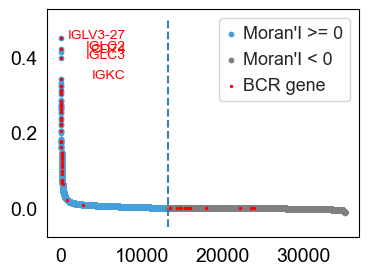

In [12]:
fig,ax = plt.subplots(figsize = (4,3))
ax.scatter(data = morandf[morandf['I']>=0], x = 'rank', y = 'I',s = 10 ,color = '#479FDA',edgecolor = None,label="Moran'I >= 0")
ax.scatter(data = morandf[morandf['I']<0], x = 'rank', y = 'I',s = 10,color = 'grey',edgecolor = None,label="Moran'I < 0")
ax.scatter(data = morandf[morandf['gene'] == 'BCR gene'], x = 'rank', y = 'I',s = 2,color = 'red',edgecolor = None,label="BCR gene")

ax.grid(False)
top5_indices = morandf.nsmallest(5, 'rank').index
for idx in top5_indices:
    x = morandf.loc[idx, 'rank']
    y = morandf.loc[idx, 'I']
    ax.text(x+8000, y, str(idx), fontsize  = 10, color='red', ha='right')
    
ax.vlines(x = morandf[morandf['I']<0]['rank'].iloc[0],ymin = -0.05,ymax = 0.5,linestyle = '--',color = '#377DC1')
ax.legend()
# fig.savefig('./sup4b.moranrank.pdf',bbox_inches = 'tight')

# figure 2c

### stereo-seq IGL（V/D/J） gene

In [14]:
rna.obs[['x','y']] = rna.obsm['spatial']
gene_count = rna.obs[['x','y','total_counts']]

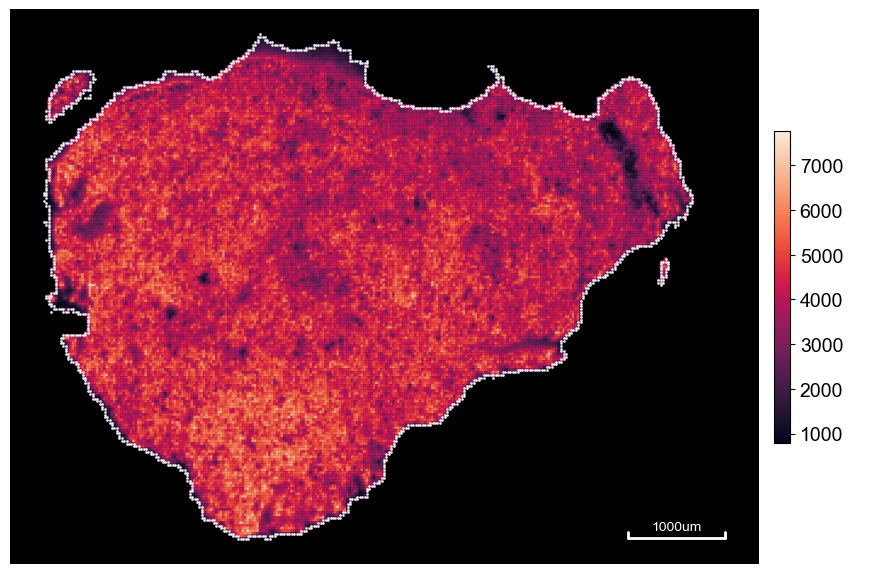

In [696]:
fig,ax = plt.subplots(figsize = (10,7.3))
ax.set_facecolor('black')

hull = cellbin.uns['hull']

sns.scatterplot(data = gene_count, x = 'x' ,y = 'y',hue = 'total_counts' , s = 5,edgecolor = None, palette='rocket',rasterized =True,ax = ax,legend=None)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 1,alpha = 0.8,rasterized =True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_title('')
ax.grid(False)
ax.invert_yaxis()


scalebar_length = 2000 
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'1000um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)


norm = plt.Normalize(vmin=gene_count['total_counts'].min(), vmax=gene_count['total_counts'].max())
sm = plt.cm.ScalarMappable(cmap="rocket", norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.02)
cbar.set_label('Total Counts', color='white')  # 设置颜色条的标签

cbar.ax.yaxis.set_tick_params(color='black')
cbar.outline.set_edgecolor('black')
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='black')

plt.show()
fig.savefig('./total_count.pdf')

In [15]:
gem = pd.read_csv('/data_hub1/fengyu/07.NBT/ST/15.KC.C03628C1/KC.C03628C1.tissue.gem.gz',compression = 'gzip',comment = '#',sep = '\t')

In [16]:
bgem = gem[gem['geneID'].apply(lambda x : x.startswith('IGL'))]

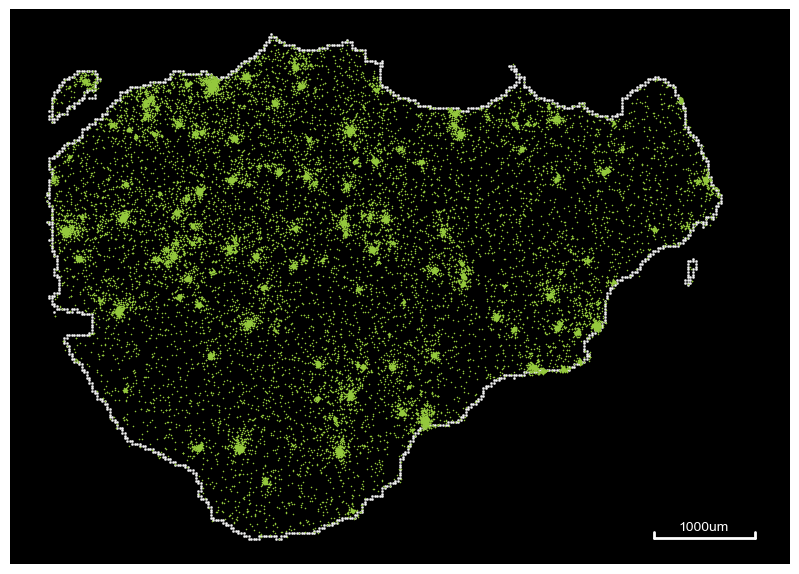

In [17]:
fig,ax = plt.subplots(figsize = (10,7.3))
ax.set_facecolor('black')

hull = cellbin.uns['hull']
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 1,alpha = 0.8,rasterized =True)

sns.scatterplot(data = bgem, x = 'x' ,y = 'y' , s = 1,edgecolor = None, color = "#94C83D",rasterized =True,ax = ax,legend=None)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_title('')
ax.grid(False)
ax.invert_yaxis()
scalebar_length = 2000 
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'1000um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)

# fig.savefig('./igl.gene.pdf')

In [19]:
meta = pd.read_csv('/storage/fengyu/liuzhong/Cyclone/15_ZLA_KC/metadata/15_ZLA_KC.meta.gz',compression='gzip')

/tmp/ipykernel_3580044/2942154875.py:1: DtypeWarning: Columns (4,11,18) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv('/storage/fengyu/liuzhong/Cyclone/15_ZLA_KC/metadata/15_ZLA_KC.meta.gz',compression='gzip')


In [20]:
igl_meta = meta[meta['isotype'] == 'IGL']
igl_meta['binid'] = 'DNB_' + (igl_meta['x'] // 50 * 50).map(str) + '_' + (igl_meta['y']// 50* 50).map(str)
igl_meta = igl_meta[igl_meta['binid'].isin(rna.obs_names)].copy()

/tmp/ipykernel_3580044/4068555257.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  igl_meta['binid'] = 'DNB_' + (igl_meta['x']// 50* 50).map(str) + '_' + (igl_meta['y']// 50* 50).map(str)


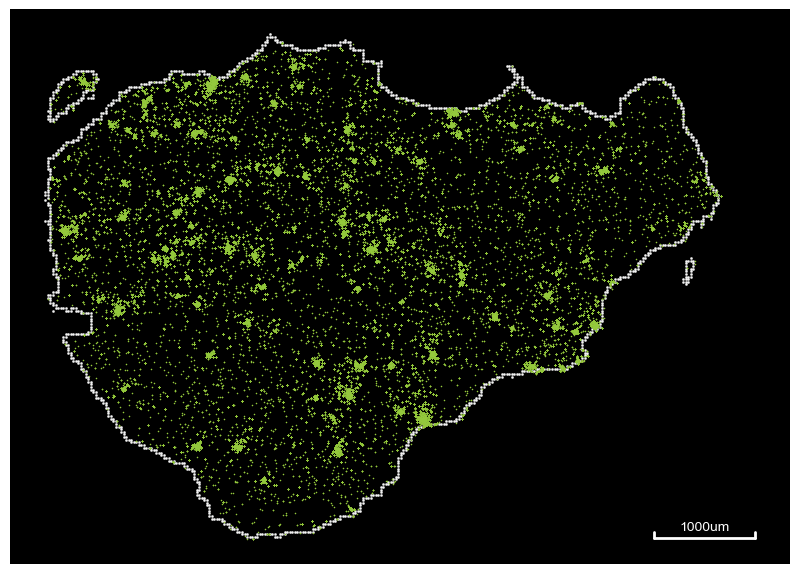

In [21]:
fig,ax = plt.subplots(figsize = (10,7.3))
ax.set_facecolor('black')
hull = cellbin.uns['hull']
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 1,alpha = 0.8,rasterized =True)

sns.scatterplot(data = igl_meta, x = 'x' ,y = 'y' , s = 1,edgecolor = None, color = "#94C83D",rasterized =True,ax = ax,legend=None)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_title('')
ax.invert_yaxis()

ax.grid(False)

scalebar_length = 2000 
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'1000um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)


# fig.savefig('./tra.xcr.pdf')

In [22]:
binsize = 50
bgem['loc'] = (bgem['x']//binsize*binsize).map(str) + '_' + (bgem['y']//binsize*binsize).map(str)
igl_meta['loc'] = (igl_meta['x']//binsize*binsize).map(str) + '_' + (igl_meta['y']//binsize*binsize).map(str)

ngs_igl_expression = bgem[['loc','MIDCount']].groupby('loc').sum()
xcr_igl_expression = igl_meta.drop_duplicates(['cdr3name','loc'])['loc'].value_counts().to_frame()

/tmp/ipykernel_3580044/257655816.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bgem['loc'] = (bgem['x']//binsize*binsize).map(str) + '_' + (bgem['y']//binsize*binsize).map(str)


In [23]:
ngs_igl_expression['xcr_count'] = xcr_igl_expression['count']
xcr_igl_expression['ngs_count'] = ngs_igl_expression['MIDCount']
ngs_igl_expression = ngs_igl_expression.dropna()
xcr_igl_expression = xcr_igl_expression.dropna()

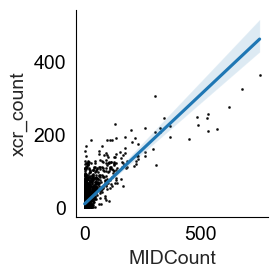

In [24]:
g = sns.lmplot(data=ngs_igl_expression, x="MIDCount", y="xcr_count",scatter_kws = {'s':1,'color':'black'}, height=3)
ax = g.ax
ax.grid(False)
# g.savefig('./figure2.coo.pdf')

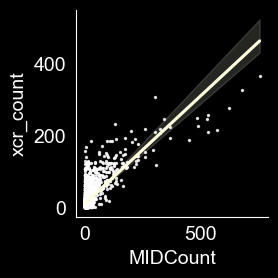

In [25]:
g = sns.lmplot(data=ngs_igl_expression, x="MIDCount", y="xcr_count",
               scatter_kws={'s':2, 'color':'white'},line_kws={'color': 'lightyellow'}, height=3)
fig = g.fig
ax = g.ax
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
ax.grid(False)
ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
# g.savefig('./Fig2e.coo.pdf')

In [26]:
import numpy as np
from scipy.stats import pearsonr
X = ngs_igl_expression['MIDCount'].values.flatten()
y = ngs_igl_expression['xcr_count'].values.flatten()
correlation, p_value = pearsonr(X, y)
print(f"Pearson correlation coefficient: {correlation}")

Pearson correlation coefficient: 0.7620668264222479


In [7]:
IGL_gene = [ gene for gene in rna.var_names if gene.startswith('IGL')]
IGK_gene = [ gene for gene in rna.var_names if gene.startswith('IGK')]
IGH_gene = [ gene for gene in rna.var_names if gene.startswith('IGH')]

In [8]:
IGL_gene.remove('IGLON5')

In [9]:
IGH_gene.remove('IGHMBP2')

# agg

In [10]:
rna.obs['IGL_expression'] = np.sum(rna[:,IGL_gene].X,axis = 1)
rna.obs['IGK_expression'] = np.sum(rna[:,IGK_gene].X,axis = 1)
rna.obs['IGH_expression'] = np.sum(rna[:,IGH_gene].X,axis = 1)
rna.obs['BCR_expression'] = rna.obs['IGL_expression'] + rna.obs['IGK_expression'] + rna.obs['IGH_expression']

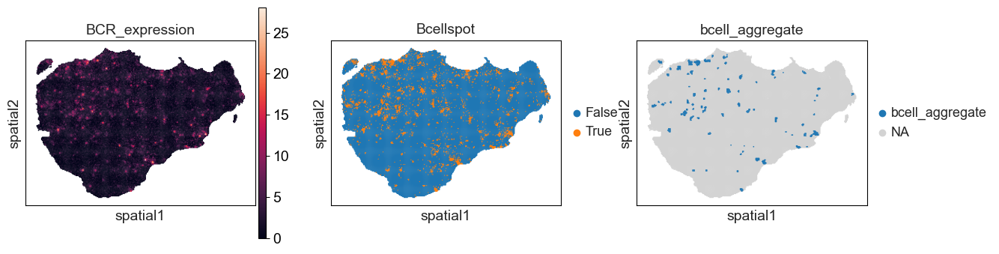

In [11]:
rna.obs[f'Bcellspot'] = rna.obs[f'BCR_expression'] > np.percentile(rna[rna.obs[f'BCR_expression'] !=0].obs[f'BCR_expression'],85)
spaxcr.tl.aggregate(rna,groups = True,groupby = f'Bcellspot',method = 'knn',k = 10,cutoffmode='p20',aggregate_name=f'bcell_aggregate')
sc.pl.spatial(rna,color = [f'BCR_expression',f'Bcellspot',f'bcell_aggregate'],spot_size = 80,basis = 'spatial')

In [12]:
# combine_cellbin_binadata(cellbin,rna,'IGL_aggregate',binsize = 50,basis = 'spatial')

/tmp/ipykernel_660557/373686870.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub_subadata.obs['aggregate'] = dbscan.fit_predict(coordinates)


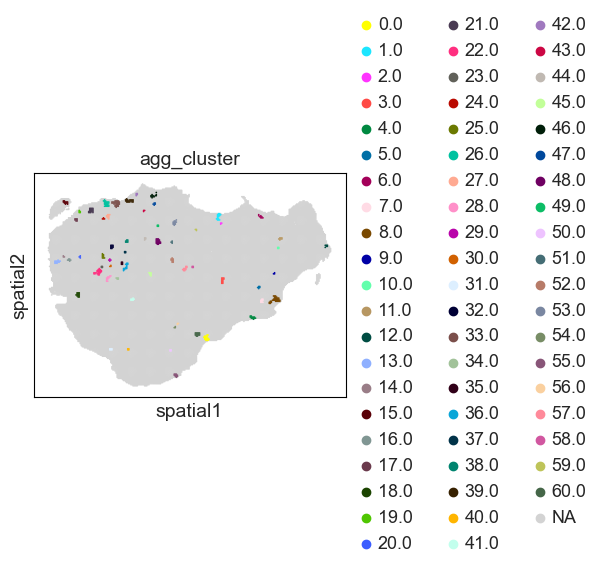

In [13]:
from sklearn.cluster import DBSCAN

sub_subadata = rna[rna.obs['bcell_aggregate'] == 'bcell_aggregate']
# sub_subadata = rna[rna.obs['Bcellspot']]
coordinates = sub_subadata.obsm['spatial']
dbscan = DBSCAN(eps = 100, min_samples = 3) 
sub_subadata.obs['aggregate'] = dbscan.fit_predict(coordinates)

rna.obs['agg_cluster'] = sub_subadata.obs['aggregate']
rna.obs['agg_cluster'] = rna.obs['agg_cluster'].map(lambda x :  np.nan if x == -1 or np.isnan(x) else str(x))
sc.pl.spatial(rna,color = 'agg_cluster',spot_size = 80,basis = 'spatial')

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/seaborn/categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


Text(0.5, 0, 'Area')

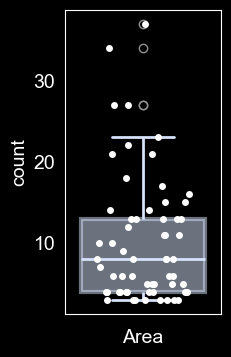

In [16]:
fig,ax = plt.subplots(figsize = (2,4))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

vc = rna.obs['agg_cluster'].value_counts()
# vc[vc>100] =100
sns.boxplot(vc, ax=ax, color='lightyellow', linewidth=3,
            boxprops=dict(facecolor='none', color='#D6E2FB',alpha = 0.5),
            whiskerprops=dict(color='#D6E2FB', linewidth=2),
            capprops=dict(color='#D6E2FB', linewidth=2),
            medianprops=dict(color='#D6E2FB', linewidth=2))
sns.stripplot(vc,ax=  ax,jitter=0.3,color = 'white',edgecolor = None)
ax.grid(False)

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
ax.set_xlabel('Area')
# fig.savefig('./umi/Fig2f.area.pdf',bbox_inches = 'tight')

In [17]:
vc_median = vc.median()
vc_q25 = vc.quantile(0.25)
vc_q75 = vc.quantile(0.75)
print(f"Median: {vc_median}")
print(f"Q25: {vc_q25}")
print(f"Q75: {vc_q75}")

Median: 8.0
Q25: 4.0
Q75: 13.0


In [14]:
combine_cellbin_binadata(cellbin,rna,'agg_cluster',binsize = 50,basis = 'spatial')

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/seaborn/categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


Text(0.5, 0, 'Cells')

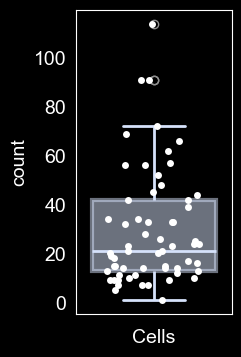

In [18]:
fig,ax = plt.subplots(figsize = (2,4))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

vc = cellbin.obs['agg_cluster'].value_counts()
# vc[vc>100] =100
sns.boxplot(vc, ax=ax, color='lightyellow', linewidth=3,
            boxprops=dict(facecolor='none', color='#D6E2FB',alpha = 0.5),
            whiskerprops=dict(color='#D6E2FB', linewidth=2),
            capprops=dict(color='#D6E2FB', linewidth=2),
            medianprops=dict(color='#D6E2FB', linewidth=2))
sns.stripplot(vc,ax=  ax,jitter=0.3,color = 'white',edgecolor = None)
ax.grid(False)

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
ax.set_xlabel('Cells')
# fig.savefig('./umi/Fig2f.cells.pdf',bbox_inches = 'tight')

In [19]:
vc_median = vc.median()
vc_q25 = vc.quantile(0.25)
vc_q75 = vc.quantile(0.75)
print(f"Median: {vc_median}")
print(f"Q25: {vc_q25}")
print(f"Q75: {vc_q75}")

Median: 21.0
Q25: 13.0
Q75: 42.0


In [35]:
area_dict = dict(zip(rna.obs['agg_cluster'].value_counts().index,rna.obs['agg_cluster'].value_counts().values))

In [65]:
colors = pd.read_csv('/storage/liuyi/09.ma_tcr/color/colors_80.csv')

In [66]:
rna.uns['agg_cluster_colors'] = colors['x'].tolist()[:len(rna.uns['agg_cluster_colors'])]

In [67]:
import random
random.seed(61)
shuffled_list = random.sample(rna.uns['agg_cluster_colors'] , len(rna.uns['agg_cluster_colors']))
rna.uns['agg_cluster_colors'] = shuffled_list

In [70]:
pd.DataFrame(shuffled_list).to_csv('figure_color.csv',index=None,header=None)

In [20]:
shuffled_list = pd.read_csv('figure_color.csv',header=None)[0].tolist()
rna.uns['agg_cluster_colors'] = shuffled_list

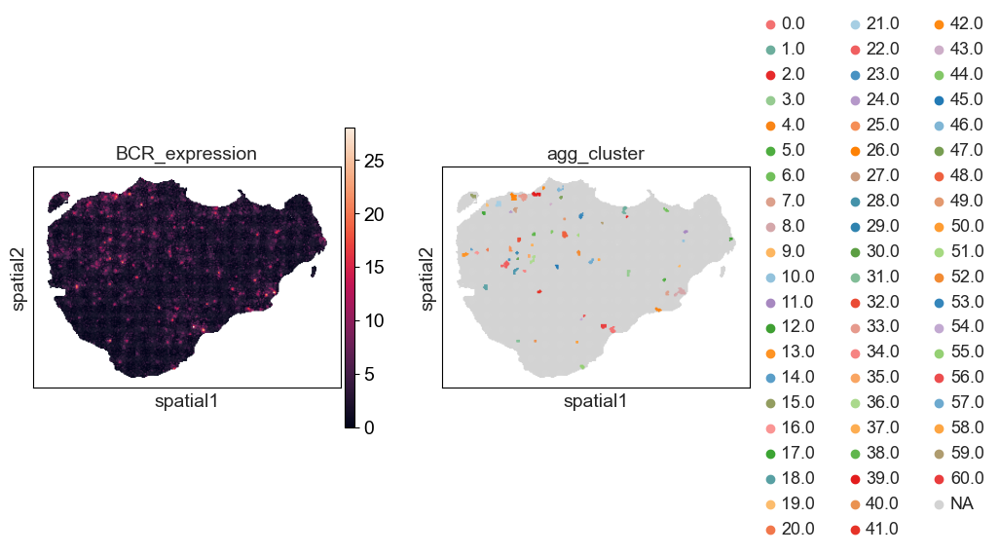

In [21]:
sc.pl.spatial(rna,color = ['BCR_expression','agg_cluster'],spot_size = 80,basis = 'spatial')

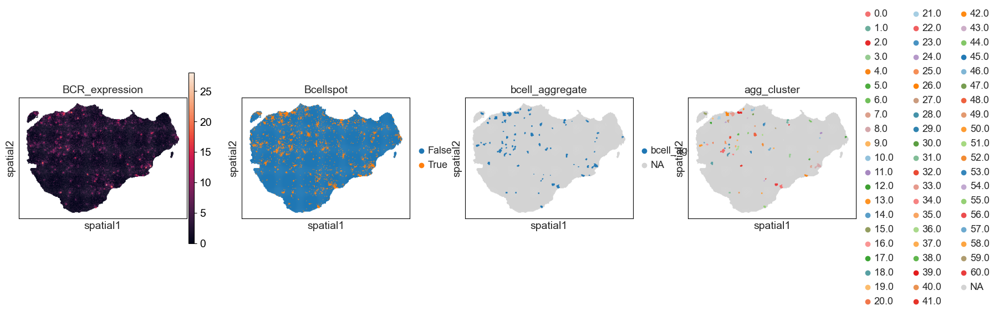

In [75]:
rna.obs['agg_area'] = rna.obs['agg_cluster'].map(lambda x :  'agg' if isinstance(x,str) else 'other')
rna.uns['agg_area_colors'] = ['#479FDA','#EDEFF6']
sc.pl.spatial(rna,color = ['BCR_expression',f'Bcellspot',f'bcell_aggregate','agg_cluster'],ncols = 10,spot_size = 80,basis = 'spatial',save = 'bcr_agg.sup.pdf')

In [25]:
rna.obs[['x','y']] = rna.obsm['spatial']

/tmp/ipykernel_1669850/833636484.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  background['value'] = rna.obs['agg_cluster']


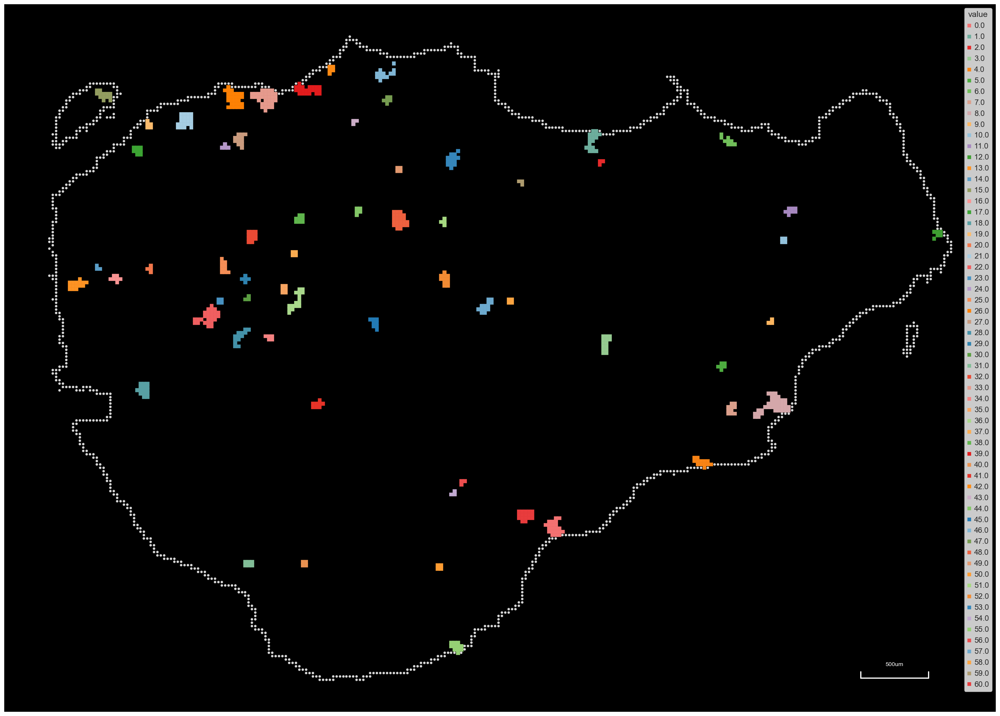

In [26]:
hull = cellbin.uns['hull']
fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

background = rna.obs[['x','y']]
background['value'] = rna.obs['agg_cluster']

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],palette=dict(zip(rna.obs['agg_cluster'].cat.categories,rna.uns['agg_cluster_colors'])),marker='s' ,edgecolors=None,rasterized =True,alpha = 1)



ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)

scalebar_length = 1000
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'500um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)


fig.savefig('./umi/agg.new.cluster.bin50.pdf')

In [27]:
rna.obs['agg_cluster'] = rna.obs['agg_cluster'].map(lambda x : 'A'+x.split('.')[0] if isinstance(x,str) else np.nan)

In [28]:
combine_cellbin_binadata(cellbin,rna,'agg_cluster',binsize = 50,basis = 'spatial')

In [29]:
color_dict = dict(zip(rna.obs['agg_cluster'].cat.categories,rna.uns['agg_cluster_colors']))

/tmp/ipykernel_1669850/4137452233.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cellidslist = cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).tolist()
/tmp/ipykernel_1669850/4137452233.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  colors = [ color_dict[i] for i in cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).index]


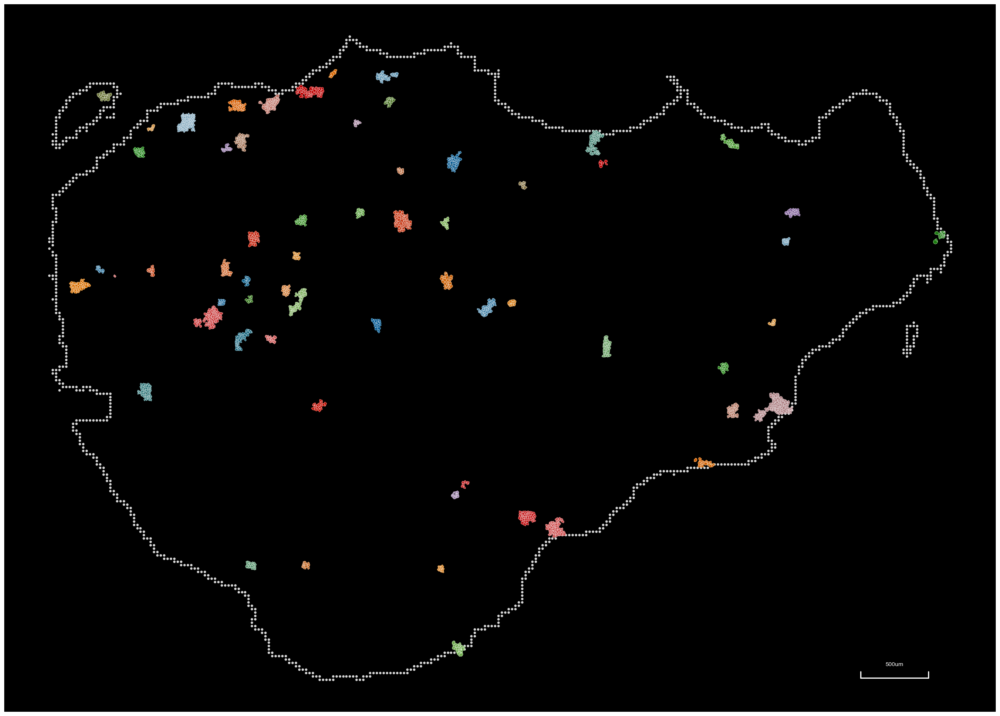

In [89]:
cellidslist = cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).tolist()
colors = [ color_dict[i] for i in cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).index]


hull = cellbin.uns['hull']
total_cell = list(set([ cell for i in cellidslist for cell in i]))
fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)

scalebar_length = 1000
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'500um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)


fig.savefig('./umi/agg.new.cluster.pdf')

/tmp/ipykernel_1262522/2059492973.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cellidslist = cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).tolist()
/tmp/ipykernel_1262522/2059492973.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  colors = [ color_dict[i] for i in cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).index]
/tmp/ipykernel_1262522/2059492973.py:3: De

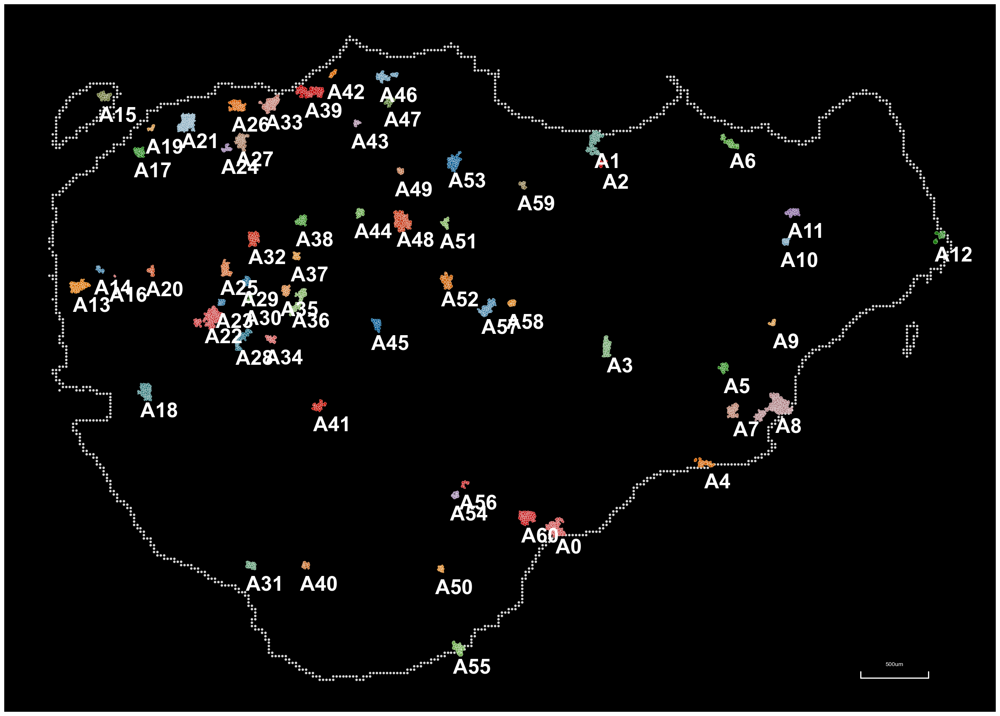

In [83]:
cellidslist = cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).tolist()
colors = [ color_dict[i] for i in cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).index]
name = cellbin.obs.groupby('agg_cluster').apply(lambda x: list(x.index)).index

hull = cellbin.uns['hull']
total_cell = list(set([ cell for i in cellidslist for cell in i]))
fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]
m= 0
for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)
    center_x = outlinespot['x'].mean()
    center_y = outlinespot['y'].mean()
    
    ax.text(center_x + 200, center_y + 300, name[m], ha='center', va='center', fontsize=35, fontweight='bold', color='white')
    m+=1

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)

scalebar_length = 1000
scalebar_x = ax.get_xlim()[1]- 2000
scalebar_y = ax.get_ylim()[0]- 500
scalebar_height = 200

ax.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], color='white', lw=2)
ax.text(scalebar_x + scalebar_length / 2 , scalebar_y - 200, f'500um', color='white', ha='center', va='center', fontsize=10)
ax.plot([scalebar_x, scalebar_x], [scalebar_y - scalebar_height / 2, scalebar_y], color='white', lw=2)
ax.plot([scalebar_x + scalebar_length, scalebar_x + scalebar_length], [scalebar_y - scalebar_height / 2, scalebar_y ], color='white', lw=2)


# fig.savefig('./agg.cluster.name.pdf')
fig.savefig('./umi/agg.new.cluster.name.pdf')

In [90]:
from collections import Counter

In [91]:
chain = 'IGL'
ntop = 5
total_cdr3 = []
figure2_cdr3 = []
agg_num = cellbin.obs['agg_cluster'].unique().shape[0] -1
for agg_cluster in [ 'A'+str(num) for num in range(agg_num+1)]:
    agg_figure2 = False
    
    if agg_cluster in ['A15','A12','A0','A59']:
        agg_figure2 = True
        
    subcellbin = cellbin[cellbin.obs['agg_cluster'] == agg_cluster]
    tmp_total_cdr3 = []
    for cell in subcellbin.obs_names:
        cdr3s = cellbin.uns['XCR']['i2c'][chain].get(cell)
        if cdr3s:
            cdr3s = list(set(cdr3s))
            tmp_total_cdr3.extend(cdr3s)

            
    if len(tmp_total_cdr3)!=0:
        elements = tmp_total_cdr3
        element_counts = Counter(elements)
        top5_elements = element_counts.most_common(ntop)
        
        total_cdr3.extend([ a for a,b in top5_elements])
        if agg_figure2:
            figure2_cdr3.extend([ a for a,b in top5_elements])
            
                
colors = pd.read_csv('/storage/liuyi/09.ma_tcr/color/colors_100.csv')
colordict = dict(zip(set(total_cdr3),colors['x'].tolist()))
print(len(set(total_cdr3)))

84


In [92]:
# cdr3color = pd.DataFrame({'cdr3':colordict.keys(),'color':colordict.values()})
# cdr3color.to_csv('cdr3_color.csv',index=None)

In [93]:
cdr3color = pd.read_csv('cdr3_color.csv')
cdr3_agg_colordict = dict(zip(cdr3color['cdr3'],cdr3color['color']))

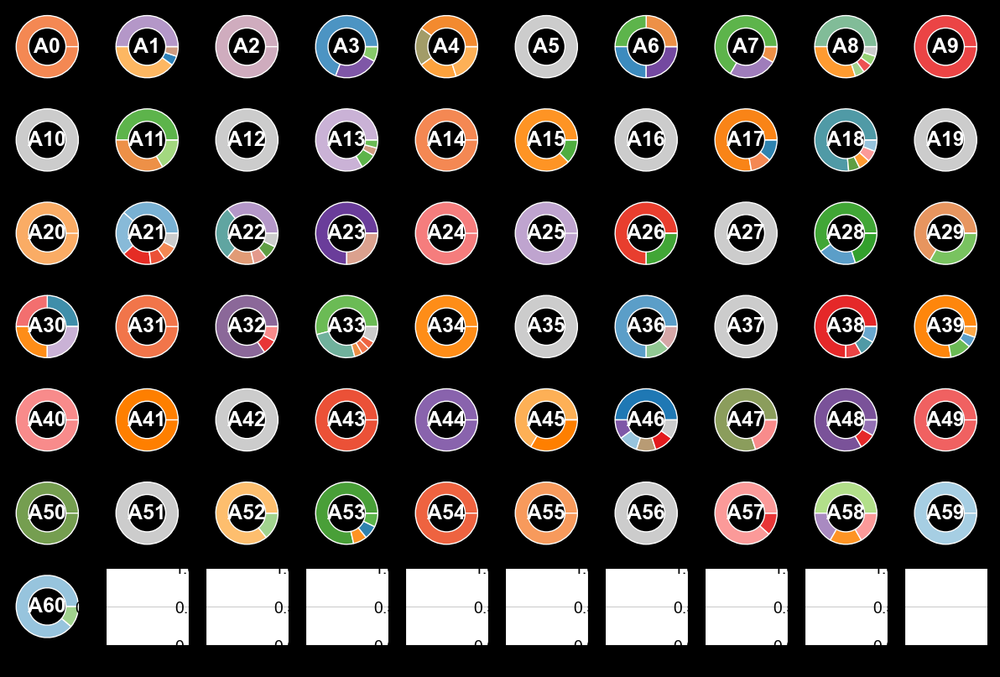

In [94]:
no_list = []
fig,axs = plt.subplots(7,10,figsize = (15,10))

fig.patch.set_facecolor('black')

for idx,agg_cluster in enumerate([ 'A'+str(num) for num in range(agg_num)]):
    ax = axs[idx//10][idx%10]

    subcellbin = cellbin[cellbin.obs['agg_cluster'] == agg_cluster]
    total_cdr3 = []
    
    for cell in subcellbin.obs_names:
        cdr3s = cellbin.uns['XCR']['i2c'][chain].get(cell)
        if cdr3s:
            cdr3s = list(set(cdr3s))
            total_cdr3.extend(cdr3s)
            
    if len(total_cdr3)!=0:
        elements = total_cdr3
        element_counts = Counter(elements)
        top5_elements = element_counts.most_common(ntop)
        other_count = sum([count for elem, count in element_counts.items() if elem not in dict(top5_elements)])
        labels = [elem for elem, count in top5_elements] + ['Other']
        sizes = [count for elem, count in top5_elements] + [other_count]
        colors = [cdr3_agg_colordict[elem] for elem, count in top5_elements] + ['#CCCCCC']
        ax.pie(sizes,colors=colors,startangle=0,wedgeprops=dict(width=0.4,edgecolor = 'white'))
        ax.text(0, 0, agg_cluster, ha='center', va='center', fontsize=18, fontweight='bold',color = 'white')
    else:
        ax.pie([1],colors=['#CCCCCC'],startangle=0,wedgeprops=dict(width=0.4))
        ax.text(0, 0, agg_cluster, ha='center', va='center', fontsize=18, fontweight='bold',color = 'white')
        
fig.savefig('./figures/pie.pdf',bbox_inches = 'tight')

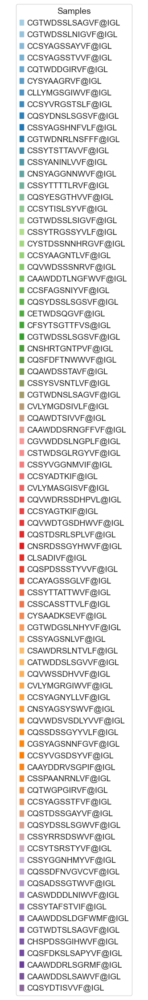

In [95]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots()
ax.axis('off')
legend_handles = [mpatches.Patch(color=color, label=label) for label, color in cdr3_agg_colordict.items()]
ax.legend(handles=legend_handles, title='Samples', loc='center')
fig.savefig('./figures//pie.legend.pdf',bbox_inches = 'tight')

In [19]:
other_list = []
d_list = []
for chain in ['IGH','IGL','IGK','TRA','TRB']:
    diversitydf = spaxcr.tl.diversity(cellbin,method = 'shannon',groupby = 'agg_cluster',chain = chain)
    diversitydf['chain'] = chain
    dropnadiversityodf = diversitydf[~diversitydf['agg_cluster'].isna()].copy()
    nadiversityodf = diversitydf[diversitydf['agg_cluster'].isna()].copy()
    other_list.append(nadiversityodf['shannon'].iloc[0])
    d_list.append(dropnadiversityodf)
chain_diversity = pd.concat(d_list,ignore_index=True)

/tmp/ipykernel_52135/219308542.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'}, whis=0, showfliers=False,


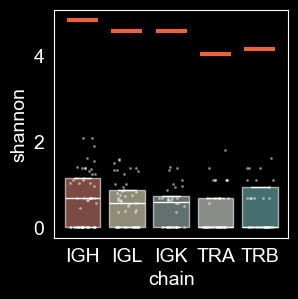

In [24]:
fig,ax = plt.subplots(figsize = (3,3))

sns.boxplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'}, whis=0, showfliers=False,
           boxprops=dict( edgecolor='white',alpha = 0.6),  
    whiskerprops=dict(color='white'), 
    capprops=dict(color='white'), 
    medianprops=dict(color='white'))
sns.stripplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,jitter=0.3,s = 2,color = 'white',alpha = 0.5,rasterized =True)
ax.hlines(y = other_list[0],xmin = -0.35,xmax = 0.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[1],xmin = 0.65,xmax = 1.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[2],xmin = 1.65,xmax = 2.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[3],xmin = 2.65,xmax = 3.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[4],xmin = 3.65,xmax = 4.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.grid(False)

fig.patch.set_facecolor('black')
ax.set_facecolor('black')
ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')

fig.savefig('./figures//Fig2j.shannon.pdf',bbox_inches = 'tight')

/tmp/ipykernel_3192119/4108169379.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'}, whis=0, showfliers=False,


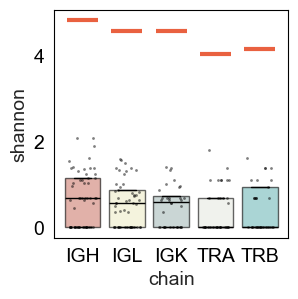

In [20]:
fig,ax = plt.subplots(figsize = (3,3))

sns.boxplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'}, whis=0, showfliers=False,
           boxprops=dict( edgecolor='black',alpha = 0.6),  
    whiskerprops=dict(color='black'), 
    capprops=dict(color='black'), 
    medianprops=dict(color='black'))
sns.stripplot(data = chain_diversity, x = 'chain',y = 'shannon',ax = ax,jitter=0.3,s = 2,color = 'black',alpha = 0.5,rasterized =True)
ax.hlines(y = other_list[0],xmin = -0.35,xmax = 0.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[1],xmin = 0.65,xmax = 1.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[2],xmin = 1.65,xmax = 2.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[3],xmin = 2.65,xmax = 3.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.hlines(y = other_list[4],xmin = 3.65,xmax = 4.35,linestyles='-',linewidth = 3,color = '#E96140')
ax.grid(False)

# fig.patch.set_facecolor('black')
# ax.set_facecolor('black')
# ax.spines['bottom'].set_color('white')
# ax.spines['top'].set_color('white')
# ax.spines['right'].set_color('white')
# ax.spines['left'].set_color('white')
# ax.tick_params(axis='x', colors='white')
# ax.tick_params(axis='y', colors='white')
# ax.yaxis.label.set_color('white')
# ax.xaxis.label.set_color('white')
# ax.title.set_color('white')

fig.savefig('./figures//Fig2j.black.shannon.pdf',bbox_inches = 'tight')

In [25]:
other_list

[4.831832628544283,
 4.580553650298189,
 4.571665632716104,
 4.0376343385774875,
 4.158606571222917]

In [26]:
grouped = chain_diversity.groupby('chain')['shannon']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_52135/2142488219.py:2: FutureWarning: The provided callable <function median at 0x7f20d4421550> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


,Median,Q25,Q75
chain,,,
IGH,0.693147,0.0,1.153742
IGK,0.599425,-0.0,0.736751
IGL,0.562335,0.0,0.863083
TRA,-0.000000,0.0,0.693147
TRB,-0.000000,0.0,0.950271


In [46]:
chain_diversity.to_csv('diversity.csv',index=None)

In [608]:
_calc_shannon({'a':700,'b':300,'c':250})

0.9890938651821026

## top50 plot

In [8]:
from sklearn.neighbors import KDTree

In [96]:
def categorize_expansion(value):
    if value == 1:
        return 'notexpanded'
    elif 1 < value < 6:
        return 'small'
    elif 6 <= value < 20:
        return 'medium'
    elif value >= 20:
        return 'hyperexpanded'

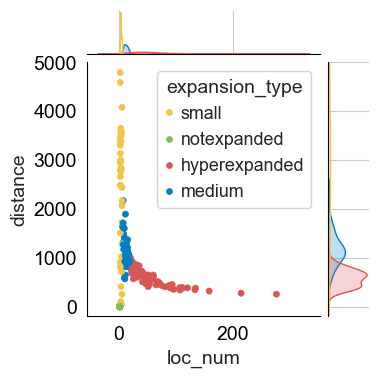

In [96]:
chain = 'IGL'
xdict = dict(zip(cellbin.obs_names,cellbin.obs['x']))
ydict = dict(zip(cellbin.obs_names,cellbin.obs['y']))
cdr3df = []
for cdr3,cdr3loc in cellbin.uns['XCR']['c2i'][chain].items():
    loc_num = len(cdr3loc)
    if loc_num >= 2:
        xloc = [ xdict[cell] for cell in cdr3loc]
        yloc = [ ydict[cell] for cell in cdr3loc]
        cdr3loc = pd.DataFrame({'x':xloc,'y':yloc}).values
        tree = KDTree(cdr3loc)
        tmpquery = tree.query(cdr3loc, k = min(2,loc_num))
        # tmpquery = tree.query(cdr3loc, k = 2)
        distances = tmpquery[0][:, 1:] 
        indices = tmpquery[1][:, 1:] 
        meandistance = np.mean(np.min(distances,axis =1))
    else:
        meandistance = 0
    cdr3df.append([cdr3,loc_num,meandistance])

cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)

cdr3df = pd.DataFrame(cdr3df,columns = ['cdr3','loc_num','distance'])
clonetypedict = dict(zip(cloneexpandsion[f'CDR3'],cloneexpandsion['expansion']))
cdr3df['expansion_type'] = cdr3df['cdr3'].map(clonetypedict)
cl_dict = dict(zip(['notexpanded','small','medium','hyperexpanded'][::-1],['#D75755','#007FC7','#F1C548','#83BC5B']))
g = sns.jointplot(x="loc_num", y="distance",kind='scatter',hue = 'expansion_type',palette=cl_dict,s = 20, data=cdr3df,color="m", height=4,ylim = (-200,5000),
                  edgecolor = None)
# g.ax_marg_x.set_ylim(0, 0.005)
# g.ax_marg_y.set_xlim(0, 0.0003)
plt.grid(False)
g.savefig(f'./figures/sup4.{chain}.dot.pdf')

In [97]:
igl_cdr3df = cdr3df.copy()

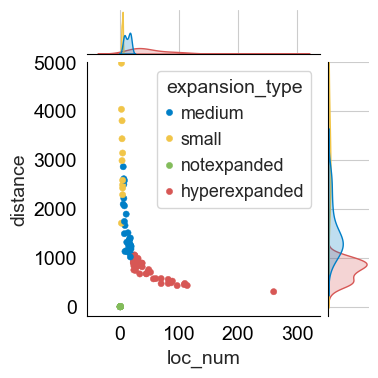

In [98]:
chain = 'TRA'
xdict = dict(zip(cellbin.obs_names,cellbin.obs['x']))
ydict = dict(zip(cellbin.obs_names,cellbin.obs['y']))
cdr3df = []
for cdr3,cdr3loc in cellbin.uns['XCR']['c2i'][chain].items():
    loc_num = len(cdr3loc)
    if loc_num >= 2:
        xloc = [ xdict[cell] for cell in cdr3loc]
        yloc = [ ydict[cell] for cell in cdr3loc]
        cdr3loc = pd.DataFrame({'x':xloc,'y':yloc}).values
        tree = KDTree(cdr3loc)
        tmpquery = tree.query(cdr3loc, k = min(2,loc_num))
        # tmpquery = tree.query(cdr3loc, k = 2)
        distances = tmpquery[0][:, 1:] 
        indices = tmpquery[1][:, 1:] 
        meandistance = np.mean(np.min(distances,axis =1))
    else:
        meandistance = 0
    cdr3df.append([cdr3,loc_num,meandistance])

cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)

cdr3df = pd.DataFrame(cdr3df,columns = ['cdr3','loc_num','distance'])
clonetypedict = dict(zip(cloneexpandsion[f'CDR3'],cloneexpandsion['expansion']))
cdr3df['expansion_type'] = cdr3df['cdr3'].map(clonetypedict)
cl_dict = dict(zip(['notexpanded','small','medium','hyperexpanded'][::-1],['#D75755','#007FC7','#F1C548','#83BC5B']))
g = sns.jointplot(x="loc_num", y="distance",kind='scatter',hue = 'expansion_type',palette=cl_dict,s = 20, data=cdr3df,color="m", height=4,ylim = (-200,5000),
                  edgecolor = None)
# g.ax_marg_x.set_ylim(0, 0.005)
# g.ax_marg_y.set_xlim(0, 0.0003)
plt.grid(False)
g.savefig(f'./figures/sup4.{chain}.dot.pdf')

In [106]:
result_list = []
for chain in ['TRA','TRB','IGL','IGK','IGH']:
    xdict = dict(zip(cellbin.obs_names,cellbin.obs['x']))
    ydict = dict(zip(cellbin.obs_names,cellbin.obs['y']))
    cdr3df = []
    for cdr3,cdr3loc in cellbin.uns['XCR']['c2i'][chain].items():
        loc_num = len(cdr3loc)
        if loc_num >= 2:
            xloc = [ xdict[cell] for cell in cdr3loc]
            yloc = [ ydict[cell] for cell in cdr3loc]
            cdr3loc = pd.DataFrame({'x':xloc,'y':yloc}).values
            tree = KDTree(cdr3loc)
            tmpquery = tree.query(cdr3loc, k = min(2,loc_num))
            # tmpquery = tree.query(cdr3loc, k = 2)
            distances = tmpquery[0][:, 1:] 
            indices = tmpquery[1][:, 1:] 
            meandistance = np.mean(np.min(distances,axis =1))
        else:
            meandistance = 0
        cdr3df.append([cdr3,loc_num,meandistance])

    cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
    cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)

    cdr3df = pd.DataFrame(cdr3df,columns = ['cdr3','loc_num','distance'])
    clonetypedict = dict(zip(cloneexpandsion[f'CDR3'],cloneexpandsion['expansion']))
    cdr3df['expansion_type'] = cdr3df['cdr3'].map(clonetypedict)
    cdr3df = cdr3df.sort_values('loc_num',ascending=False)[:50]
    cdr3df['chain'] = chain
    result_list.append(cdr3df)

In [109]:
result = pd.concat(result_list)

/tmp/ipykernel_3969696/1951759470.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = result,x = 'chain',y = 'distance',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'})


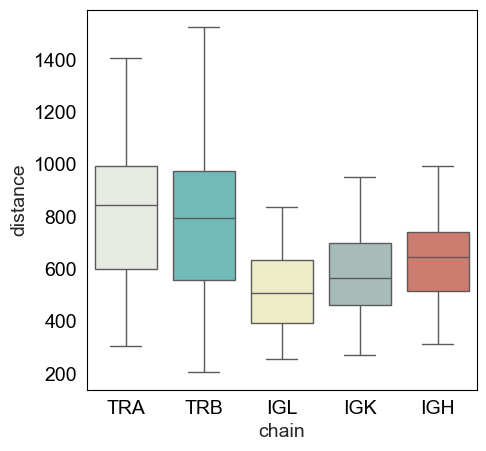

In [151]:
fig,ax = plt.subplots(figsize = (5,5))

sns.boxplot(data = result,x = 'chain',y = 'distance',ax = ax,palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'})
ax.grid(False)

fig.savefig('./figures/Sup6.distance.top50.pdf',bbox_inches = 'tight')
fig.show()

In [114]:
from scipy.stats import ttest_ind
import itertools

chains = result['chain'].unique()
ttest_results = []

for (chain1, chain2) in itertools.combinations(chains, 2):
    data1 = result[result['chain'] == chain1]['distance']
    data2 = result[result['chain'] == chain2]['distance']
    t_stat, p_value = ttest_ind(data1, data2)
    
    # Append result as a dictionary
    ttest_results.append({
        'chain1': chain1,
        'chain2': chain2,
        't_stat': t_stat,
        'p_value': p_value
    })
ttest_results_df = pd.DataFrame(ttest_results)

In [115]:
ttest_results_df

,chain1,chain2,t_stat,p_value
0,TRA,TRB,0.519249,6.047575e-01
1,TRA,IGL,7.391433,4.921580e-11
2,TRA,IGK,5.515510,2.830468e-07
3,TRA,IGH,4.134863,7.500836e-05
4,TRB,IGL,5.705206,1.235148e-07
5,TRB,IGK,4.181206,6.313902e-05
6,TRB,IGH,2.990998,3.516975e-03
7,IGL,IGK,-2.176420,3.192648e-02
8,IGL,IGH,-4.083949,9.051331e-05
9,IGK,IGH,-1.770685,7.972243e-02


In [50]:
cdr3df['expansion_type'].value_counts()

expansion_type
notexpanded      110
hyperexpanded     70
small             49
medium            45
Name: count, dtype: int64

/tmp/ipykernel_3651310/2558977985.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = cdr3df[cdr3df['expansion_type'] != 'notexpanded'],x = 'expansion_type',y = 'distance',order = ['small','medium','hyperexpanded'],palette=cl_dict,ax = ax)


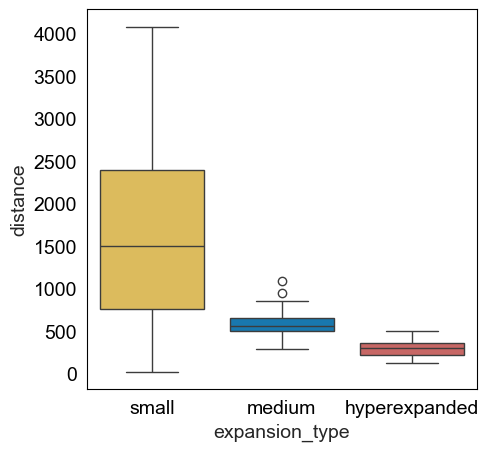

In [53]:
fig,ax = plt.subplots(figsize = (5,5))
sns.boxplot(data = cdr3df[cdr3df['expansion_type'] != 'notexpanded'],x = 'expansion_type',y = 'distance',order = ['small','medium','hyperexpanded'],palette=cl_dict,ax = ax)
ax.grid(False)
fig.savefig(f'./figures/Sup4.{chain}.box.pdf')

In [55]:
tmp = cdr3df[cdr3df['expansion_type'] != 'notexpanded']
grouped = tmp.groupby('expansion_type')['distance']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_3651310/2797314549.py:3: FutureWarning: The provided callable <function median at 0x7f1c705904c0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


,Median,Q25,Q75
expansion_type,,,
hyperexpanded,302.087834,219.246385,356.600797
medium,562.871020,505.179042,658.373551
small,1499.165956,753.959427,2395.368048


In [56]:
from sklearn.neighbors import KDTree

In [29]:
def categorize_expansion(value):
    if value == 1:
        return 'notexpanded'
    elif 1 < value < 6:
        return 'small'
    elif 6 <= value < 20:
        return 'medium'
    elif value >= 20:
        return 'hyperexpanded'

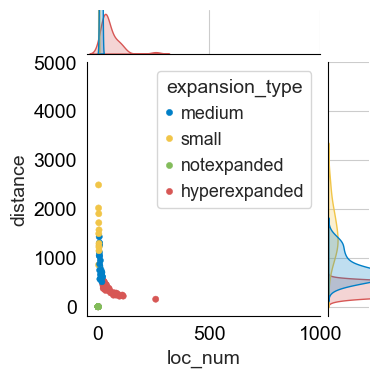

In [60]:
chain = 'TRA'
xdict = dict(zip(cellbin.obs_names,cellbin.obs['x']))
ydict = dict(zip(cellbin.obs_names,cellbin.obs['y']))
cdr3df = []
for cdr3,cdr3loc in cellbin.uns['XCR']['c2i'][chain].items():
    loc_num = len(cdr3loc)
    if loc_num >= 2:
        xloc = [ xdict[cell] for cell in cdr3loc]
        yloc = [ ydict[cell] for cell in cdr3loc]
        cdr3loc = pd.DataFrame({'x':xloc,'y':yloc}).values
        tree = KDTree(cdr3loc)
        tmpquery = tree.query(cdr3loc, k = min(2,loc_num))
        meandistance = np.mean(tmpquery[0].mean(axis=1))
    else:
        meandistance = 0
    cdr3df.append([cdr3,loc_num,meandistance])

cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)

cdr3df = pd.DataFrame(cdr3df,columns = ['cdr3','loc_num','distance'])
clonetypedict = dict(zip(cloneexpandsion[f'CDR3'],cloneexpandsion['expansion']))
cdr3df['expansion_type'] = cdr3df['cdr3'].map(clonetypedict)
cl_dict = dict(zip(['notexpanded','small','medium','hyperexpanded'][::-1],['#D75755','#007FC7','#F1C548','#83BC5B']))
g = sns.jointplot(x="loc_num", y="distance",kind='scatter',hue = 'expansion_type',palette=cl_dict,s = 20,xlim=(-50, 1000),ylim = (-200,5000), data=cdr3df,color="m", height=4, 
                  edgecolor = None)
g.ax_marg_x.set_ylim(0, 0.005)
g.ax_marg_y.set_xlim(0, 0.0003)
plt.grid(False)
g.savefig(f'./figures/Sup4.{chain}.dot.pdf')

In [59]:
cdr3df['expansion_type'].value_counts()

expansion_type
hyperexpanded    42
notexpanded      39
medium           30
small            11
Name: count, dtype: int64

/tmp/ipykernel_3651310/2558977985.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = cdr3df[cdr3df['expansion_type'] != 'notexpanded'],x = 'expansion_type',y = 'distance',order = ['small','medium','hyperexpanded'],palette=cl_dict,ax = ax)


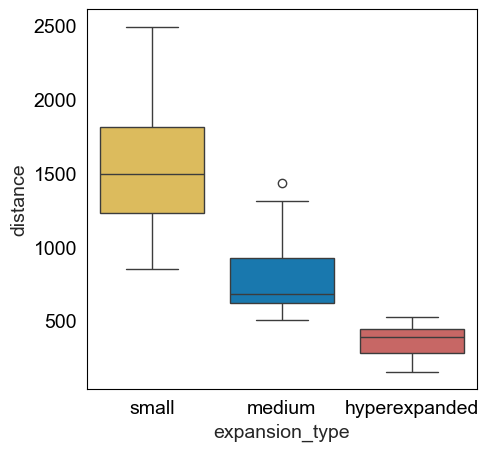

In [61]:
fig,ax = plt.subplots(figsize = (5,5))
sns.boxplot(data = cdr3df[cdr3df['expansion_type'] != 'notexpanded'],x = 'expansion_type',y = 'distance',order = ['small','medium','hyperexpanded'],palette=cl_dict,ax = ax)
ax.grid(False)
fig.savefig(f'./figures/Sup4.{chain}.box.pdf')

In [62]:
tmp = cdr3df[cdr3df['expansion_type'] != 'notexpanded']
grouped = tmp.groupby('expansion_type')['distance']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_3651310/2797314549.py:3: FutureWarning: The provided callable <function median at 0x7f1c705904c0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


,Median,Q25,Q75
expansion_type,,,
hyperexpanded,392.734412,285.378315,446.409759
medium,683.076211,619.932667,928.253775
small,1494.299265,1230.490697,1810.138440


# 一个点代表一个cell

In [63]:
chain = 'IGL'

In [64]:
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [65]:
cells_cdr3_dict = cellbin.uns['XCR']['i2c'][chain]
cell_result = []
for cell in cellbin.obs_names:
    cdr3s = cells_cdr3_dict.get(cell)
    if cdr3s:
        cdr3_ex = [expansion_dict[cdr3] for cdr3 in cdr3s]
        for cdr3_type in ['hyperexpanded','medium','notexpanded']:# ['hyperexpanded','medium','small','notexpanded']:
            if cdr3_type in cdr3_ex:
                cell_type = cdr3_type
                break
        cell_result.append([cell,cell_type])
cell_result = pd.DataFrame(cell_result,columns = ['cell','celltype'])

In [66]:
cell_result['celltype'].value_counts()

celltype
hyperexpanded    4376
medium            541
notexpanded       121
Name: count, dtype: int64

In [67]:
cellbin.obs['expansion_type'] = cellbin.obs_names.map(dict(zip(cell_result['cell'],cell_result['celltype'])))

In [68]:
cellidslist = []
for expansion_type in ['hyperexpanded','medium','notexpanded']:#['hyperexpanded','medium','small','notexpanded']:
    cellidslist.append(cellbin[cellbin.obs['expansion_type']==expansion_type].obs_names)

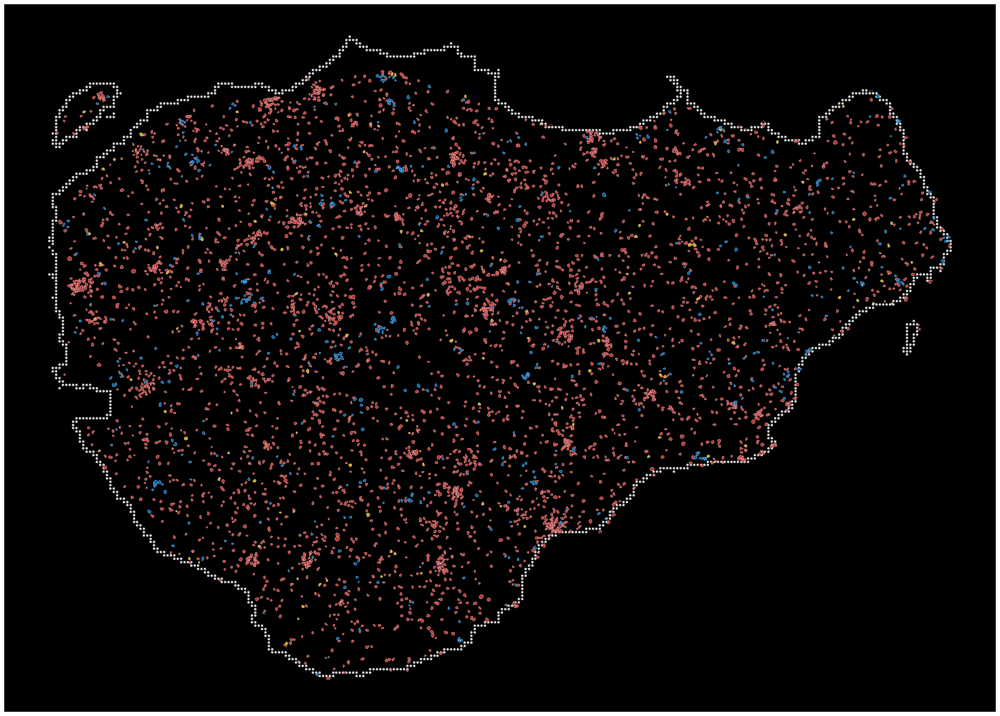

In [69]:
colors = ['#D75755','#007FC7','#F1C548','#83BC5B']

hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures//Sup4.IGL.hypercell.hyper4376.medium541.not121.pdf')

In [70]:
chain = 'TRA'

In [71]:
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [72]:
cells_cdr3_dict = cellbin.uns['XCR']['i2c'][chain]
cell_result = []
for cell in cellbin.obs_names:
    cdr3s = cells_cdr3_dict.get(cell)
    if cdr3s:
        cdr3_ex = [expansion_dict[cdr3] for cdr3 in cdr3s]
        for cdr3_type in ['hyperexpanded','medium','notexpanded']:# ['hyperexpanded','medium','small','notexpanded']:
            if cdr3_type in cdr3_ex:
                cell_type = cdr3_type
                break
        cell_result.append([cell,cell_type])
cell_result = pd.DataFrame(cell_result,columns = ['cell','celltype'])

In [73]:
cell_result['celltype'].value_counts()

celltype
hyperexpanded    2256
medium            394
notexpanded        39
Name: count, dtype: int64

In [74]:
cellbin.obs['expansion_type'] = cellbin.obs_names.map(dict(zip(cell_result['cell'],cell_result['celltype'])))

In [75]:
cellidslist = []
for expansion_type in ['hyperexpanded','medium','notexpanded']:#['hyperexpanded','medium','small','notexpanded']:
    cellidslist.append(cellbin[cellbin.obs['expansion_type']==expansion_type].obs_names)

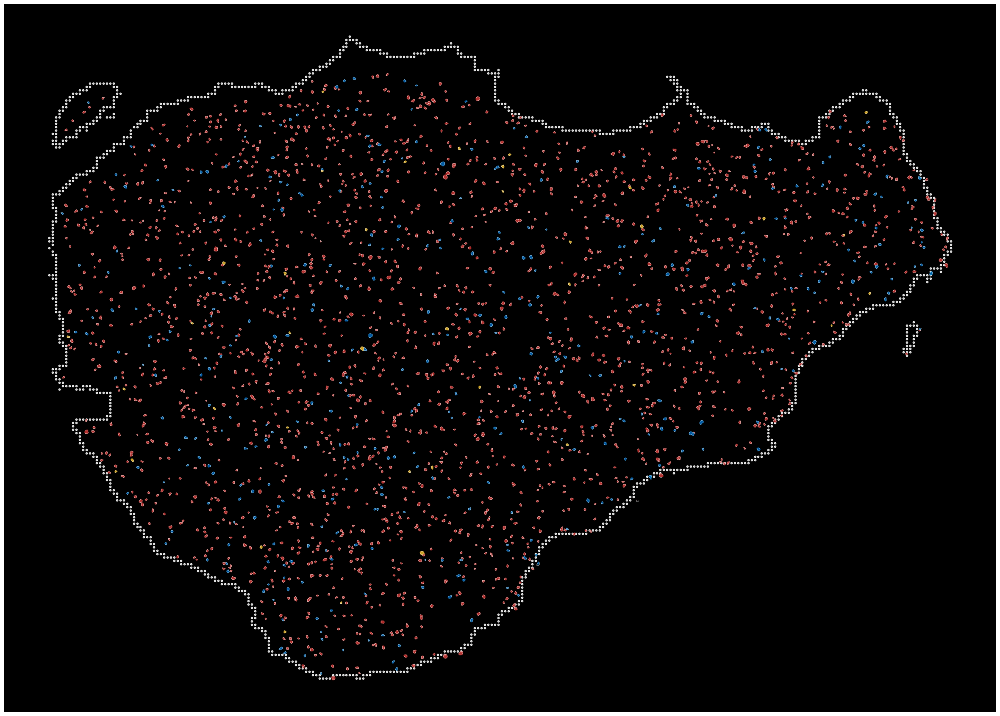

In [76]:
colors = ['#D75755','#007FC7','#F1C548','#83BC5B']

hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures//Sup4.TRA.hypercell.hyper2256.medium394.not39.pdf')

In [141]:
chain = 'TRB'

In [142]:
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [143]:
cells_cdr3_dict = cellbin.uns['XCR']['i2c'][chain]
cell_result = []
for cell in cellbin.obs_names:
    cdr3s = cells_cdr3_dict.get(cell)
    if cdr3s:
        cdr3_ex = [expansion_dict[cdr3] for cdr3 in cdr3s]
        for cdr3_type in ['hyperexpanded','medium','notexpanded']:# ['hyperexpanded','medium','small','notexpanded']:
            if cdr3_type in cdr3_ex:
                cell_type = cdr3_type
                break
        cell_result.append([cell,cell_type])
cell_result = pd.DataFrame(cell_result,columns = ['cell','celltype'])

In [144]:
cell_result['celltype'].value_counts()

celltype
hyperexpanded    3324
medium            648
notexpanded        46
Name: count, dtype: int64

In [145]:
cellbin.obs['expansion_type'] = cellbin.obs_names.map(dict(zip(cell_result['cell'],cell_result['celltype'])))

In [146]:
cellidslist = []
for expansion_type in ['hyperexpanded','medium','notexpanded']:#['hyperexpanded','medium','small','notexpanded']:
    cellidslist.append(cellbin[cellbin.obs['expansion_type']==expansion_type].obs_names)

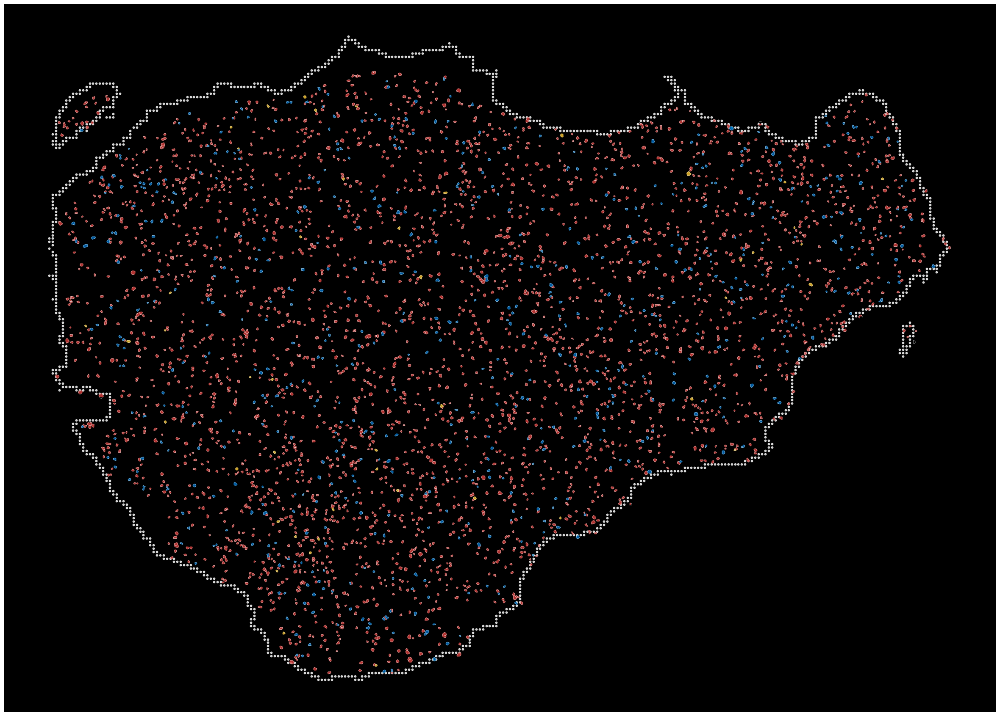

In [147]:
colors = ['#D75755','#007FC7','#F1C548','#83BC5B']

hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures//Sup4.TRB.hypercell.hyper3324.medium648.not46.pdf')

# top50

In [29]:
def categorize_expansion(value):
    if value == 1:
        return 'notexpanded'
    elif 1 < value < 6:
        return 'small'
    elif 6 <= value < 20:
        return 'medium'
    elif value >= 20:
        return 'hyperexpanded'

In [60]:
chain = 'IGL'
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [61]:
top50cdr3_incell = spaxcr.tl.query(cellbin, cdr3 = cloneexpandsion['CDR3'][:50])

In [77]:
cdr3color = pd.read_csv('cdr3_color.csv')
colordict = dict(zip(cdr3color['cdr3'],cdr3color['color']))

In [79]:
cdr3color['color'].value_counts()

color
#8B6899    1
#A6CEE3    1
#97C4DD    1
#88BAD8    1
#E19B76    1
          ..
#3C8BBE    1
#2D81B9    1
#1F78B4    1
#2F83AF    1
#3F8EAA    1
Name: count, Length: 84, dtype: int64

In [68]:
extendcolor = pd.read_csv('/storage/liuyi/09.ma_tcr/color/colors_100.csv')

In [96]:
cellidslist = []
colors = []
m=0
already_have_color_cdr3 = []

for cdr3,cells in top50cdr3_incell.items():
    cellidslist.append(cells)
    if cdr3 in colordict.keys():
        colors.append(colordict[cdr3])
        already_have_color_cdr3.append(cdr3)
    else:
        colors.append(extendcolor.iloc[-10+m]['x'])
        m+=1

In [97]:
m

8

In [98]:
rna.obs['x'] = rna.obsm['spatial'][:,0]
rna.obs['y'] = rna.obsm['spatial'][:,1]

/tmp/ipykernel_1669850/2847797819.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  background['value'] = rna.obs['agg_cluster']
/tmp/ipykernel_1669850/2847797819.py:36: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig('./figures/Fig2g.top50.alpha0.3.pdf')
/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


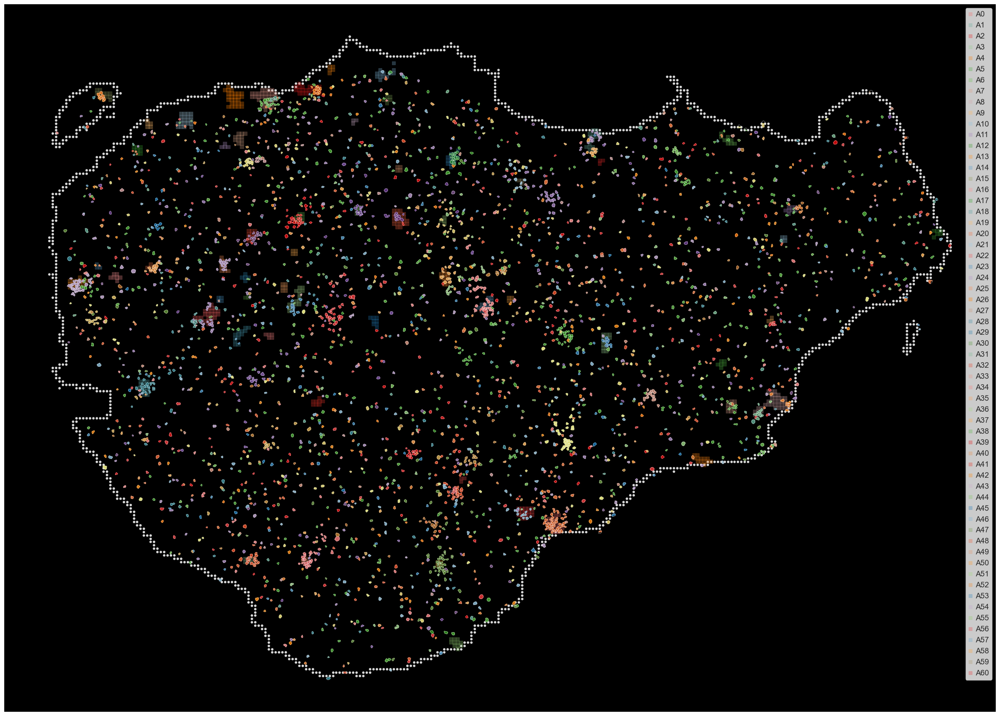

In [99]:
hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)


background = rna.obs[['x','y']]
background['value'] = rna.obs['agg_cluster']

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s',palette=dict(zip(rna.obs['agg_cluster'].cat.categories,rna.uns['agg_cluster_colors'])),edgecolors=None,rasterized =True,alpha = 0.3,)


subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures/Fig2g.top50.alpha0.3.pdf')

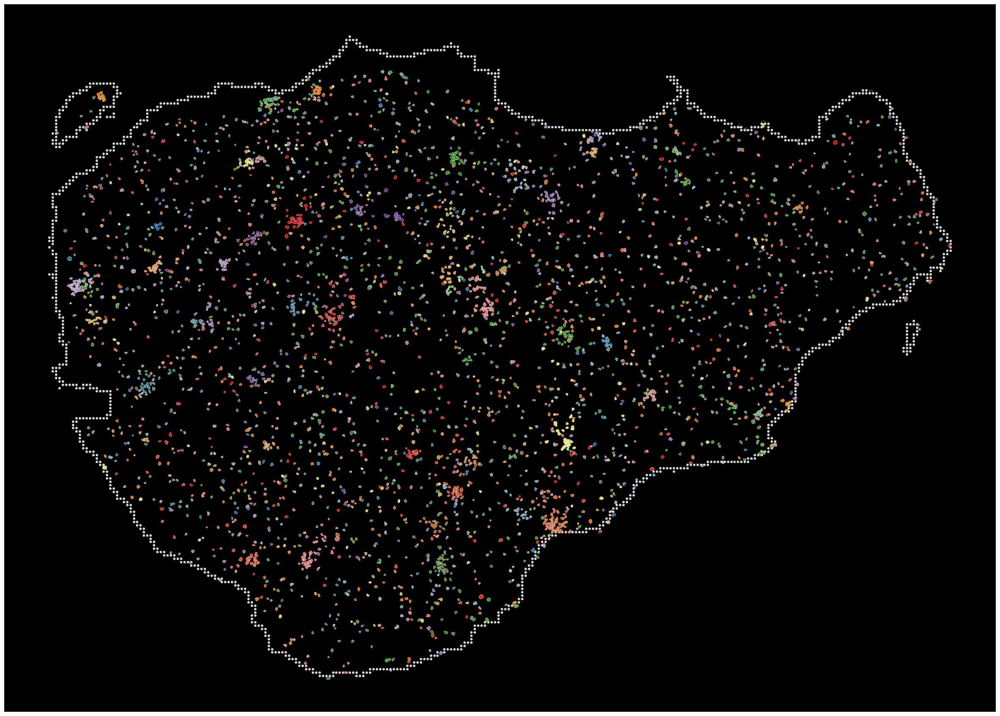

In [100]:
hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)


# background = rna.obs[['x','y']]
# background['value'] = rna.obs['agg_cluster']

# sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s',palette=dict(zip(rna.obs['agg_cluster'].cat.categories,rna.uns['agg_cluster_colors'])),edgecolors=None,rasterized =True,alpha = 0.3,)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures/Fig2g.top50.cellbin.pdf')

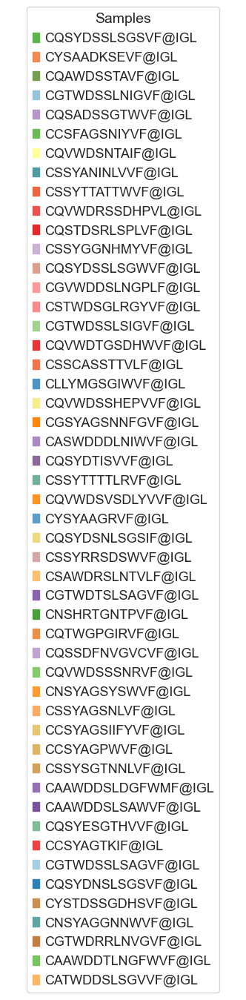

In [84]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots()
ax.axis('off')
colordict = dict(zip(top50cdr3_incell.keys(),colors))
legend_handles = [mpatches.Patch(color=color, label=label) for label, color in colordict.items()]
ax.legend(handles=legend_handles, title='Samples', loc='center')
fig.savefig('./figures//top50.legend.pdf',bbox_inches = 'tight')

In [86]:
pd.DataFrame({'cdr3':colordict.keys(),'color':colordict.values()})['color'].value_counts()

color
#5DB44B    1
#F48853    1
#759E50    1
#97C4DD    1
#B497C8    1
#6BBB55    1
#FFFF99    1
#509AA6    1
#EE6340    1
#ED5253    1
#E52829    1
#CAB2D6    1
#DBA18E    1
#FB9A99    1
#F88B8B    1
#A1D38E    1
#E83637    1
#F1754A    1
#4C94C3    1
#F6EC8C    1
#FE860C    1
#A98AC1    1
#8B6899    1
#70B19C    1
#FE9424    1
#5B9EC8    1
#EDDA7F    1
#D5A6A6    1
#FDBE6E    1
#8963AD    1
#499F38    1
#ED9047    1
#BFA4CF    1
#87CA6A    1
#FE9B31    1
#FAAC65    1
#E5C773    1
#DCB566    1
#D3A25A    1
#9471B4    1
#7A5299    1
#81BC98    1
#EB4445    1
#A6CEE3    1
#2D81B9    1
#CB904D    1
#60A5A1    1
#C27D41    1
#79C360    1
#FDB762    1
Name: count, dtype: int64

In [124]:
chain = 'TRA'
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [125]:
top50cdr3_incell = spaxcr.tl.query(cellbin, cdr3 = cloneexpandsion['CDR3'][:50])

In [126]:
totalcells = []
for cdr3,cells in top50cdr3_incell.items():
    totalcells.extend(cells)

In [127]:
cellidslist = []
for cdr3,cells in top50cdr3_incell.items():
    cellidslist.append(cells)

In [128]:
colors = pd.read_csv('/storage/liuyi/09.ma_tcr/color/colors_50.csv')

In [129]:
colors = colors['x']

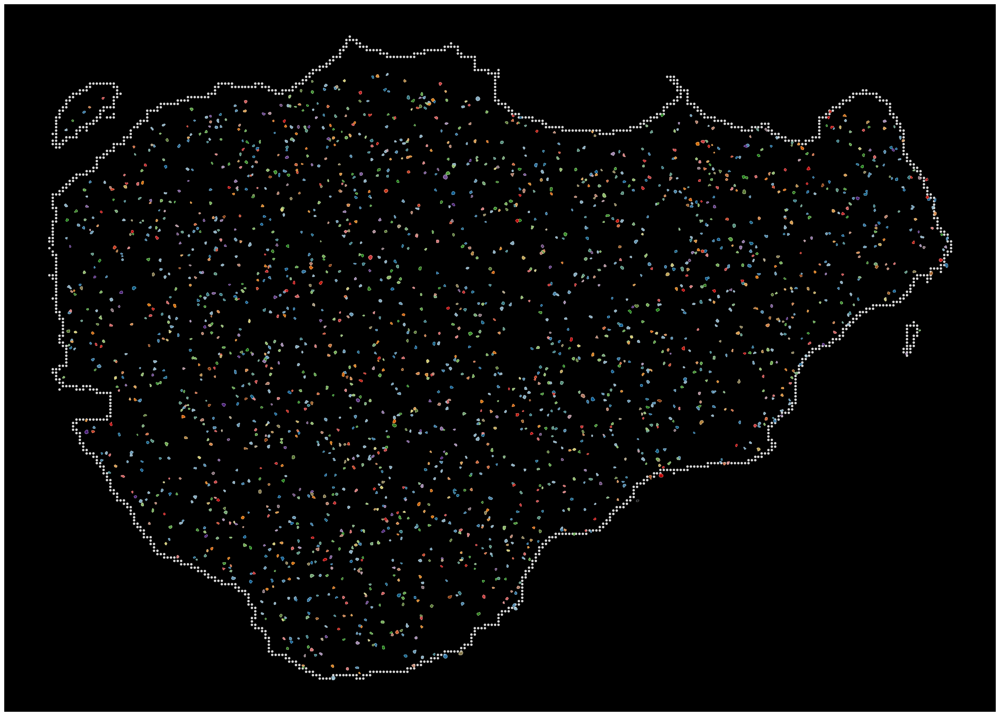

In [130]:
hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures/Sup4.TRA.top50.pdf')

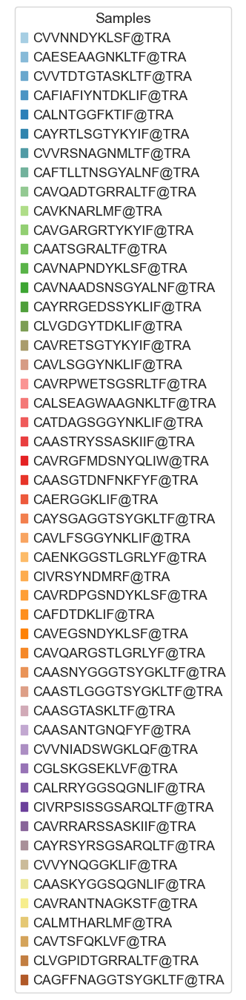

In [131]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots()
ax.axis('off')
colordict = dict(zip(top50cdr3_incell.keys(),colors))
legend_handles = [mpatches.Patch(color=color, label=label) for label, color in colordict.items()]
ax.legend(handles=legend_handles, title='Samples', loc='center')
fig.savefig('./figures//TRA.top50.legend.pdf',bbox_inches = 'tight')

In [132]:
chain = 'TRB'
cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
expansion_dict = dict(zip(cloneexpandsion['CDR3'],cloneexpandsion['expansion']))

In [133]:
top50cdr3_incell = spaxcr.tl.query(cellbin, cdr3 = cloneexpandsion['CDR3'][:50])

In [134]:
totalcells = []
for cdr3,cells in top50cdr3_incell.items():
    totalcells.extend(cells)

In [135]:
cellidslist = []
for cdr3,cells in top50cdr3_incell.items():
    cellidslist.append(cells)

In [136]:
colors = pd.read_csv('/storage/liuyi/09.ma_tcr/color/colors_50.csv')

In [137]:
colors = colors['x']

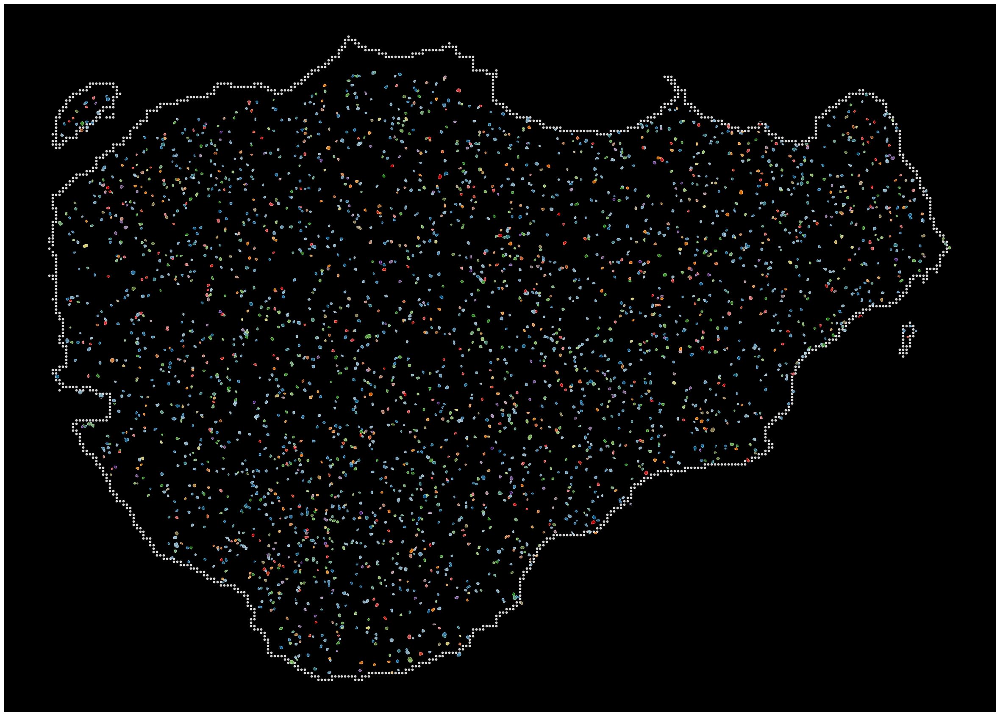

In [139]:
hull = cellbin.uns['hull']

total_cell = list(set([ cell for i in cellidslist for cell in i]))

fig,ax = plt.subplots(figsize = (30,22))
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,alpha = 0.8,rasterized =True)

subcellpose = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(total_cell)]
suboutline = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(total_cell)]

for cellids,color in zip(cellidslist,colors):
    plotspot = subcellpose[subcellpose['cellID'].isin(cellids)]
    outlinespot = suboutline[suboutline['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.2)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./figures/Sup4.TRB.top50.pdf')

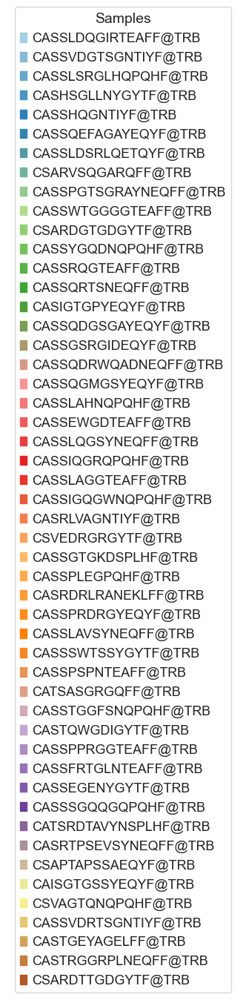

In [140]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots()
ax.axis('off')
colordict = dict(zip(top50cdr3_incell.keys(),colors))
legend_handles = [mpatches.Patch(color=color, label=label) for label, color in colordict.items()]
ax.legend(handles=legend_handles, title='Samples', loc='center')
fig.savefig('./figures//TRB.top50.legend.pdf',bbox_inches = 'tight')

# Moran index

In [21]:
cellbin.X.data = np.where(cellbin.X.data>=1,1,0)

In [22]:
def cal_moran(adata, n_jobs=1, use_raw=False, genes=None, **kwds):
    import squidpy as sq
    sq.gr.spatial_neighbors(adata, coord_type='grid')    
    if genes is None:
        genes = list(adata.var_names)
    sq.gr.spatial_autocorr(adata, n_jobs=n_jobs, mode='moran', use_raw=use_raw, genes=genes, **kwds)

In [23]:
cal_moran(cellbin)

In [24]:
morandf = cellbin.uns['moranI']

In [25]:
cdr3morandict = dict(zip(morandf.index,morandf['I']))

In [30]:
totalchain = []
for chain in ['IGH','IGL','IGK','TRA','TRB']:
    cloneexpandsion = spaxcr.tl.clonestat(cellbin,chains = chain)
    cloneexpandsion['expansion'] = cloneexpandsion['n_cells'].apply(categorize_expansion)
    cloneexpandsion['moran'] = cloneexpandsion['CDR3'].map(cdr3morandict)
    # cloneexpandsion = cloneexpandsion[cloneexpandsion['expansion'] == 'hyperexpanded']
    cloneexpandsion = cloneexpandsion[['expansion','moran']].copy()
    cloneexpandsion['chain'] = chain
    totalchain.append(cloneexpandsion)
totalchain = pd.concat(totalchain)

/tmp/ipykernel_3969696/3809598754.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = totalchain ,x = 'chain',y = 'moran',palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'},ax = ax,showfliers=False,


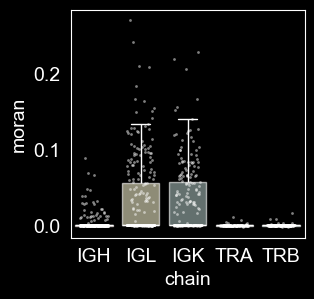

In [121]:
fig,ax = plt.subplots(figsize=(3, 3))
sns.boxplot(data = totalchain ,x = 'chain',y = 'moran',palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'},ax = ax,showfliers=False,
           boxprops=dict( edgecolor='white',alpha = 0.6),  
    whiskerprops=dict(color='white'), 
    capprops=dict(color='white'), 
    medianprops=dict(color='white'))
sns.stripplot(data = totalchain ,x = 'chain',y = 'moran',ax = ax,jitter=0.3,s = 2,edgecolor = None,color = 'white',alpha = 0.5,rasterized =True)
ax.grid(False)
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')

fig.savefig('./figures/Sup6.moran.pdf',bbox_inches = 'tight')

In [28]:
totalchain

[]

/tmp/ipykernel_3192119/2432372285.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = totalchain ,x = 'chain',y = 'moran',palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'},ax = ax,showfliers=False,


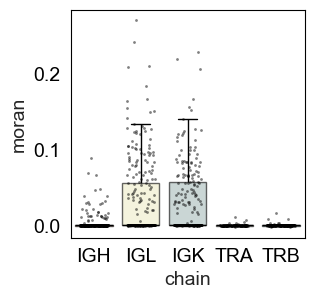

In [31]:
fig,ax = plt.subplots(figsize=(3, 3))
sns.boxplot(data = totalchain ,x = 'chain',y = 'moran',palette={'IGH':'#DD7260','IGL':'#F4F1C1','IGK':'#A3C0BC','TRA':'#E7EBE1','TRB':'#66C6C5'},ax = ax,showfliers=False,
           boxprops=dict( edgecolor='black',alpha = 0.6),  
    whiskerprops=dict(color='black'), 
    capprops=dict(color='black'), 
    medianprops=dict(color='black'))
sns.stripplot(data = totalchain ,x = 'chain',y = 'moran',ax = ax,jitter=0.3,s = 2,edgecolor = None,color = 'black',alpha = 0.5,rasterized =True)
ax.grid(False)

fig.savefig('./figures/Sup6.moran.black.pdf',bbox_inches = 'tight')

In [98]:
grouped = totalchain.groupby('chain')['moran']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_3651310/523164891.py:2: FutureWarning: The provided callable <function median at 0x7f1c705904c0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


,Median,Q25,Q75
chain,,,
IGH,-0.000021,-0.000106,-0.000010
IGK,-0.000009,-0.000021,0.056747
IGL,-0.000009,-0.000013,0.055341
TRA,-0.000070,-0.000242,-0.000011
TRB,-0.000041,-0.000105,-0.000019


In [123]:
from scipy.stats import ttest_ind
import itertools

chains = totalchain['chain'].unique()
ttest_results = []

for (chain1, chain2) in itertools.combinations(chains, 2):
    data1 = totalchain[totalchain['chain'] == chain1]['moran']
    data2 = totalchain[totalchain['chain'] == chain2]['moran']
    t_stat, p_value = ttest_ind(data1, data2)
    
    ttest_results.append({
        'chain1': chain1,
        'chain2': chain2,
        't_stat': t_stat,
        'p_value': p_value
    })
ttest_results_df = pd.DataFrame(ttest_results)
ttest_results_df

,chain1,chain2,t_stat,p_value
0,IGH,IGL,-9.654911,1.476562e-20
1,IGH,IGK,-10.690163,2.562225e-24
2,IGH,TRA,2.892731,4.013059e-03
3,IGH,TRB,3.912748,1.029952e-04
4,IGL,IGK,-0.042787,9.658883e-01
5,IGL,TRA,6.778444,4.450084e-11
6,IGL,TRB,9.263854,5.835334e-19
7,IGK,TRA,7.577417,3.183334e-13
8,IGK,TRB,10.356345,1.027662e-22
9,TRA,TRB,-0.130871,8.959528e-01


In [99]:
totalchain.to_csv('moran.csv',index=None)

In [67]:
totalchain['expansion'].value_counts()

expansion
notexpanded      337
hyperexpanded    282
medium           278
small            267
Name: count, dtype: int64

In [15]:
def query(adata,cdr3):
    csr = adata[:,cdr3].X
    non_zero_indices = np.nonzero(csr)[0]
    obs_with_value = adata.obs_names[non_zero_indices]
    return list(obs_with_value)

In [16]:
agg_list = list(cellbin.obs['agg_cluster'].unique())
agg_list.remove(np.nan)

In [17]:
pro_list = []
mutaioncelldict = {}
mutationdict = dict(zip(cellbin.var.index,cellbin.var['BCRstatus']))
m=0
for agg_cluster in agg_list:
    subadata = cellbin[cellbin.obs['agg_cluster'] == agg_cluster]
    
    unqiueclone = spaxcr.tl.clonestat(subadata, chains = 'IGL')
    unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)
    mutationcdr3 = unqiueclone[unqiueclone['mutation'] == 'mutated']['CDR3']

    mutationcells = []

    for cdr3 in mutationcdr3:
        cell = query(subadata,cdr3)
        mutationcells.extend(cell)
    cells = list(set(mutationcells))

    mutationcells = len(cells)/subadata.shape[0] * 100
#     print(f'{agg_cluster} Mutated Cells: {mutationcells:.2f} %')
    pro_list.append(mutationcells)
    mutaioncelldict[agg_cluster] = mutationcells 

In [18]:
unqiueclone = spaxcr.tl.clonestat(cellbin[cellbin.obs['agg_cluster'].isna()], chains = 'IGL')
unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)
mutationcdr3 = unqiueclone[unqiueclone['mutation'] == 'mutated']['CDR3']

mutationcells = []
subadata = cellbin[cellbin.obs['agg_cluster'].isna()]

for cdr3 in mutationcdr3:
    cell = query(subadata,cdr3)
    mutationcells.extend(cell)
cells = list(set(mutationcells))
mutationcells = len(cells)/subadata.shape[0] * 100

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/seaborn/categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


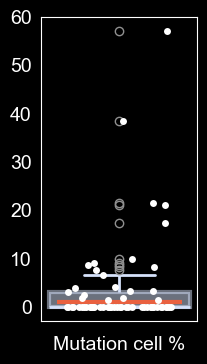

In [19]:
fig,ax = plt.subplots(figsize = (2,4))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

vc = pro_list
sns.boxplot(vc, ax=ax, color='lightyellow', linewidth=3,
            boxprops=dict(facecolor='none', color='#D6E2FB',alpha = 0.5),
            whiskerprops=dict(color='#D6E2FB', linewidth=2),
            capprops=dict(color='#D6E2FB', linewidth=2),
            medianprops=dict(color='#D6E2FB', linewidth=2))
sns.stripplot(vc,ax=  ax,jitter=0.3,color = 'white',edgecolor = None)
ax.grid(False)

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
ax.set_xlabel('Mutation cell %')
ax.hlines(y = mutationcells,xmin = -0.35,xmax = 0.35,linestyles='-',linewidth = 3,color = '#E96140')
fig.savefig('./figures//Fig2h.mutated.pdf',bbox_inches = 'tight')

In [23]:
vc_series = pd.Series(vc)
description = vc_series[vc_series>0.95].describe()
description

count    61.000000
mean      3.812643
std       9.638896
min       0.000000
25%       0.000000
50%       0.000000
75%       3.030303
max      57.142857
dtype: float64

In [26]:
(vc_series>0.95).value_counts()

False    40
True     21
Name: count, dtype: int64

In [28]:
description = vc_series[vc_series>0.95].describe()
description

count    21.000000
mean     11.074821
std      13.938303
min       1.388889
25%       3.030303
50%       6.666667
75%      10.000000
max      57.142857
dtype: float64

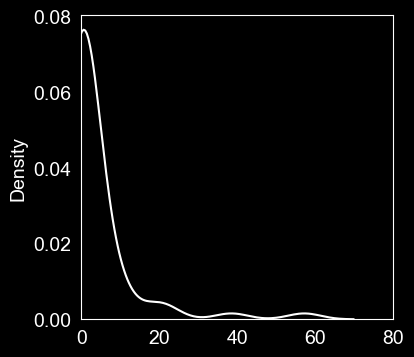

In [183]:
fig,ax = plt.subplots()
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
sns.kdeplot(pro_list,color = 'white')
ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.grid(False)
ax.set_xlim(-0,80)
fig.savefig('./figures/Fig2h.kde.pdf')